In [1]:
import pandas as pd
import numpy as np
import spatialdata as sd
import spatialdata_io
import scanpy as sc
from tqdm import tqdm
import seaborn as sns
import matplotlib.pyplot as plt
from datetime import datetime
np.random.seed(0)
from scipy.stats import zscore
import geopandas as gpd
import spatialdata_plot
import matplotlib as mpl
import scipy
import os
import importlib
from scipy.stats import ranksums
import numpy as np

mpl.rcParams['pdf.fonttype'] = 42 # to edit text in Illustrator

paper_path = os.path.dirname(os.getcwd())#"/mnt/x/Common/Lab_Papers/shedding_potential/"
fig_path = paper_path + "/fig4/"
utils_path = paper_path + "/utils/"
oliviera_p3_nat_path = paper_path + '/external_datasets/S_P3_NAT/'

os.chdir(utils_path)
print(os.getcwd())
import shed_funcs

lowres_name = 'Visium_HD_Human_Colon_Normal_P3_lowres_image'
hires_name = 'Visium_HD_Human_Colon_Normal_P3_hires_image'
full_res_name = 'Visium_HD_Human_Colon_Normal_P3_full_image'
cytassist_name = 'Visium_HD_Human_Colon_Normal_P3_cytassist_image'

data2um = "Visium_HD_Human_Colon_Normal_P3_square_002um"
data8um = "Visium_HD_Human_Colon_Normal_P3_square_008um"
data16um = "Visium_HD_Human_Colon_Normal_P3_square_016um"

# set the default font to Arial
from matplotlib.font_manager import FontProperties, fontManager
from matplotlib import rcParams
# Path to Arial font
arial_path = utils_path+'/Arial.ttf'

# Define font properties with the specific path
arial_font = FontProperties(fname=arial_path)
fontManager.addfont(arial_path)

# Set the font as the default for all text elements
rcParams['font.family'] = arial_font.get_family()
rcParams['font.sans-serif'] = [arial_font.get_name()]

/Users/talbarkai/opt/anaconda3/envs/turnover_env/lib/python3.10/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/Users/talbarkai/opt/anaconda3/envs/turnover_env/lib/python3.10/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/Users/talbarkai/opt/anaconda3/envs/turnover_env/lib/python3.10/site-packages/anndata/utils.py:434: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instea

/Users/talbarkai/Data/shedding_potential/zenodo/utils


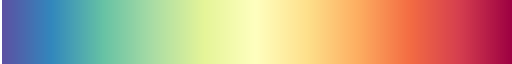

In [2]:
from spatialdata_plot.pl.utils import set_zero_in_cmap_to_transparent
new_cmap_spectral = set_zero_in_cmap_to_transparent(cmap="Spectral_r")
new_cmap_spectral

In [3]:
EXPORT_FLAG = True
print("EXPORT STATUS:", EXPORT_FLAG)

EXPORT STATUS: True


## Load Dan et al, bulk data

In [4]:
UMI_THRESH = 10000

stav_adata = sc.read_h5ad(paper_path + "/external_datasets/dan_et_al_raw_anndata.h5ad")
stav_adata.obs['sample_type'] = stav_adata.obs.sample_type.str.lower().astype(str)

print(stav_adata.shape)
specific_genes_to_remove = ["MTRNR2L12", "MTRNR2L1", "MTRNR2L8"]
filter_genes = stav_adata.var_names.str.startswith("MT-") + stav_adata.var_names.isin(specific_genes_to_remove) + stav_adata.var_names.str.contains("RPL") + stav_adata.var_names.str.contains("RPS")
stav_adata = stav_adata[:,~filter_genes]
print(stav_adata.shape)

# keep protein coding genes
biomart_tbl = pd.read_csv(utils_path + 'Human_GRch38_91_ensemblBioMart_ref.csv')
biomart_tbl_pc = biomart_tbl[(biomart_tbl['gene_biotype'] == "protein_coding")]
stav_adata = stav_adata[:,stav_adata.var_names.isin(biomart_tbl_pc['external_gene_name'])].copy()
print(stav_adata.shape)

stav_adata.var["mt"] = stav_adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(stav_adata, qc_vars=['mt'], inplace=True)

# filter samples with less than 10000 UMIs
print(stav_adata.shape)
stav_adata = stav_adata[stav_adata.obs.total_counts > UMI_THRESH,:]
print(stav_adata.shape)

stav_adata.obs['log10_total_counts'] = np.log10(stav_adata.obs['total_counts'])
stav_adata.layers['counts'] = stav_adata.X.copy()
stav_adata.layers['mat_norm'] = sc.pp.normalize_total(stav_adata, target_sum=1, inplace=False,exclude_highly_expressed=True, max_fraction=0.1)['X']

stav_adata

(266, 60591)
(266, 59066)
(266, 19096)
(266, 19096)
(232, 19096)


/Users/talbarkai/opt/anaconda3/envs/turnover_env/lib/python3.10/site-packages/scanpy/preprocessing/_qc.py:428: RuntimeWarning: invalid value encountered in divide
  return values / sums[:, None]
/var/folders/12/7sg1l7495mg7m46t8zdt5pzm0000gn/T/ipykernel_2751/1828669346.py:26: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  stav_adata.obs['log10_total_counts'] = np.log10(stav_adata.obs['total_counts'])


AnnData object with n_obs × n_vars = 232 × 19096
    obs: 'sample_name', 'rt_barcode', 'pool', 'i7', 'i7_barcode', 'sample_type', 'location', 'patient', 'gender', 'year_of_birth', 'disease', 'year_of_diagnosis', 'weight', 'smoking', 'intestinal_resection', 'concomitant_illnesses', 'disease_location', 'concomitant_biological_therapy', 'concomitant_immunomodulator_therapy', 'concomitant_5asa_therapy', 'concomitant_steroids', 'endoscopic_inflammation', 'histological_inflammation', 'run', 'disease_str', 'inf_type', 'sum_of_umis', 'log10_sum_of_umis', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'log10_total_counts'
    var: 'gene_name', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 

(92, 19096)


/Users/talbarkai/Data/shedding_potential/zenodo/utils/shed_funcs.py:47: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = model.params[0] + model.params[1] * x  # params[0] is the intercept, params[1] is the slope


Correlation: 0.7453015572684808, p-value: 0.0


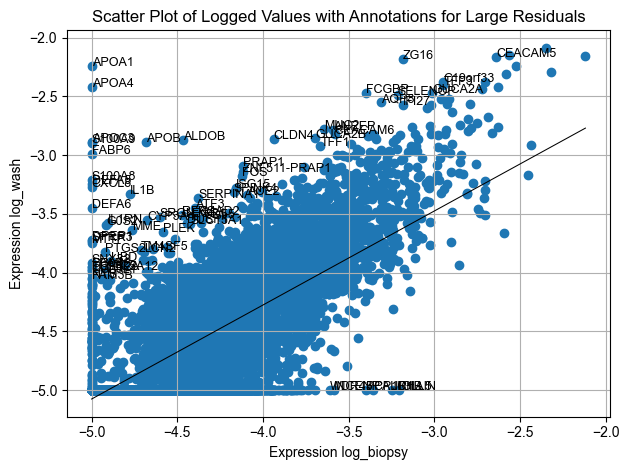

In [5]:
# select controls and RL colon
sdata_hc = stav_adata[(stav_adata.obs.disease_str == "control") * (stav_adata.obs.location.isin(["R","L"]))].copy()
print(sdata_hc.shape)

resids_hc = shed_funcs.calc_resids_by_field(sdata_hc, "sample_type", "biopsy", "wash", RESID_THRESH=1, layer='mat_norm')
resids_hc['gene_display'] = resids_hc.index

/Users/talbarkai/Data/shedding_potential/zenodo/utils/shed_funcs.py:103: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y = model.params[0] + model.params[1] * x  # params[0] is the intercept, params[1] is the slope


Correlation: 0.7453015572684808, p-value: 0.000000e+00
Manually evaluating minimal p-value:
p < 1e-323


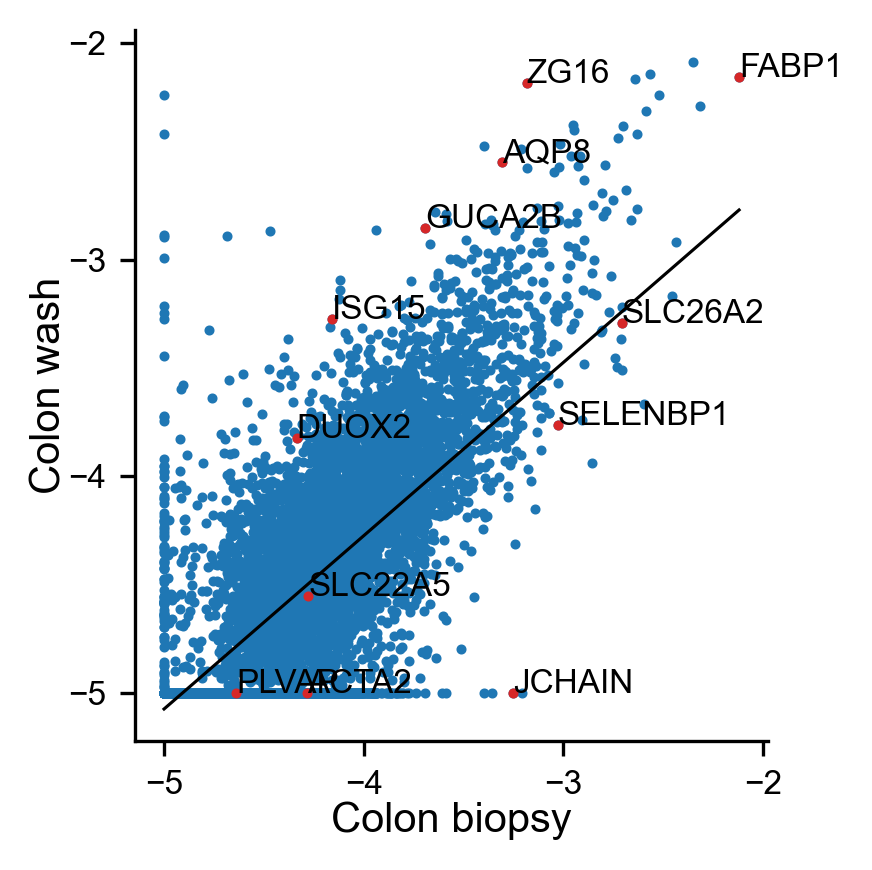

exporting


In [6]:
# reload shed_funcs
importlib.reload(shed_funcs)

shed_funcs.plot_tissue_shed_for_fig(resids_hc, ["FABP1","GUCA2B","ZG16","ISG15","AQP8",
                                                "DUOX2","SELENBP1","SLC26A2","SLC22A5","JCHAIN","ACTA2","PLVAP"],
                                    fontsize=8,figsize=(3,3),spot_size=2, add_arrows=False, reg_line_width=0.75,
                                    my_xlabel="Colon biopsy", my_ylabel="Colon wash", use_adjust_text=False, white_outline_width=0,
                                    exp_path=fig_path+"Fig4A_colon_biopsy_wash.pdf")

In [7]:
import plotly.express as px
px.scatter(resids_hc, x="log_biopsy", y="log_wash", hover_data=["gene_display"],)

ValueError: Mime type rendering requires nbformat>=4.2.0 but it is not installed

Figure({
    'data': [{'customdata': array([['A1BG'],
                                   ['A1CF'],
                                   ['A2M'],
                                   ...,
                                   ['ZYG11B'],
                                   ['ZYX'],
                                   ['ZZEF1']], shape=(19096, 1), dtype=object),
              'hovertemplate': 'log_biopsy=%{x}<br>log_wash=%{y}<br>gene_display=%{customdata[0]}<extra></extra>',
              'legendgroup': '',
              'marker': {'color': '#636efa', 'symbol': 'circle'},
              'mode': 'markers',
              'name': '',
              'showlegend': False,
              'type': 'scattergl',
              'x': {'bdata': ('0oGVwFYdfsC9Cn3ATo6XwAAAoMC8tZ' ... 'Bx947AAACgwIOHisAex5bAYr9iwA=='),
                    'dtype': 'f4'},
              'xaxis': 'x',
              'y': {'bdata': ('AACgwOPNgMAAAKDAAACgwAAAoMAAAK' ... 'AAAKDAAACgwAAAoMCSzpHAmLt0wA=='),
                    'dtype': 'f4'},
              'yaxis': 'y'}],
    'layout': {'legend': {'tracegroupgap': 0},
               'margin': {'t': 60},
               'template': '...',
               'xaxis': {'anchor': 'y', 'domain': [0.0, 1.0], 'title': {'text': 'log_biopsy'}},
               'yaxis': {'anchor': 'x', 'domain': [0.0, 1.0], 'title': {'text': 'log_wash'}}}
})

## Load spatial data

In [8]:
scalefactor_path = oliviera_p3_nat_path+"/binned_outputs/square_008um/spatial/scalefactors_json.json"
scalefactors = pd.read_json(scalefactor_path, typ='series')
scalefactors

spot_diameter_fullres          29.221942
bin_size_um                     8.000000
microns_per_pixel               0.273767
regist_target_img_scalef        0.074477
tissue_lowres_scalef            0.007448
fiducial_diameter_fullres    1205.405127
tissue_hires_scalef             0.074477
dtype: float64

In [9]:
fullres_path = oliviera_p3_nat_path+"/Visium_HD_Human_Colon_Normal_P3_tissue_image_CROPPED2.tif"
folder_path = oliviera_p3_nat_path
# create spatialdata object
sdata = spatialdata_io.visium_hd(folder_path, fullres_image_file=fullres_path)

for table in sdata.tables.values():
    table.var_names_make_unique()
    
sdata

/Users/talbarkai/opt/anaconda3/envs/turnover_env/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning:

Variable names are not unique. To make them unique, call `.var_names_make_unique`.

/Users/talbarkai/opt/anaconda3/envs/turnover_env/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning:

Variable names are not unique. To make them unique, call `.var_names_make_unique`.

/Users/talbarkai/opt/anaconda3/envs/turnover_env/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning:

Variable names are not unique. To make them unique, call `.var_names_make_unique`.



SpatialData object
├── Images
│     ├── 'Visium_HD_Human_Colon_Normal_P3_full_image': DataTree[cyx] (3, 42537, 25000), (3, 21268, 12500), (3, 10634, 6250), (3, 5317, 3125), (3, 2658, 1562)
│     ├── 'Visium_HD_Human_Colon_Normal_P3_hires_image': DataArray[cyx] (3, 3168, 6000)
│     └── 'Visium_HD_Human_Colon_Normal_P3_lowres_image': DataArray[cyx] (3, 317, 600)
├── Shapes
│     ├── 'Visium_HD_Human_Colon_Normal_P3_square_002um': GeoDataFrame shape: (7793528, 1) (2D shapes)
│     ├── 'Visium_HD_Human_Colon_Normal_P3_square_008um': GeoDataFrame shape: (487552, 1) (2D shapes)
│     └── 'Visium_HD_Human_Colon_Normal_P3_square_016um': GeoDataFrame shape: (122274, 1) (2D shapes)
└── Tables
      ├── 'square_002um': AnnData (7793528, 18085)
      ├── 'square_008um': AnnData (487552, 18085)
      └── 'square_016um': AnnData (122274, 18085)
with coordinate systems:
    ▸ 'Visium_HD_Human_Colon_Normal_P3', with elements:
        Visium_HD_Human_Colon_Normal_P3_full_image (Images), Visium_HD_Huma

In [10]:
# add tissue positions in fullres image
tissue_positions = pd.read_parquet(folder_path+"/binned_outputs/square_008um/spatial/tissue_positions.parquet")
tissue_positions.index = tissue_positions.barcode

# add tissue positions with pxls location in fullres to sdata obs
sdata.tables['square_008um'].obs = sdata.tables['square_008um'].obs.join(tissue_positions, how='left', rsuffix='_r')

In [11]:

sdata.tables['square_008um'].layers['counts'] = sdata.tables['square_008um'].X.copy()
sc.pp.normalize_total(sdata.tables['square_008um'], target_sum=1)
sdata.tables['square_008um'].layers['mat_norm'] = sdata.tables['square_008um'].X.copy()

# add turnover score
print(resids_hc.shape)
intersect_genes = np.intersect1d(resids_hc.index, sdata.tables['square_008um'].var_names)
shedding_resids = resids_hc.loc[intersect_genes]
print(resids_hc.shape)

sdata.tables['square_008um'].obs['shedding_score'] = None
sdata.tables['square_008um'].var['shedding_residual'] = None
sdata.tables['square_008um'].var.loc[shedding_resids.index, 'shedding_residual']= shedding_resids['residual']

tmp_ad = sdata.tables['square_008um'][:,shedding_resids.index].copy()
sc.pp.normalize_total(tmp_ad, target_sum=1, exclude_highly_expressed=True, max_fraction=0.1)

print(tmp_ad.shape)

resids_vals = np.array(tmp_ad.var['shedding_residual'])
resids_vals = np.expand_dims(resids_vals, axis=1).ravel()
resids_matnorm = tmp_ad.layers['mat_norm']

shedding_scores = resids_matnorm @ resids_vals.astype(float)

tmp_ad.obs['shedding_score'] = np.squeeze(np.array(shedding_scores))
# send back the shedding score from the tmp_ad to the adata
sdata.tables['square_008um'].obs.loc[tmp_ad.obs.index, 'shedding_score'] = tmp_ad.obs.loc[tmp_ad.obs.index, 'shedding_score'].astype(float)

/Users/talbarkai/opt/anaconda3/envs/turnover_env/lib/python3.10/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning:

The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12030. The TBB threading layer is disabled.

/Users/talbarkai/opt/anaconda3/envs/turnover_env/lib/python3.10/site-packages/legacy_api_wrap/__init__.py:82: UserWarning:

Some cells have zero counts



(19096, 6)
(19096, 6)


/Users/talbarkai/opt/anaconda3/envs/turnover_env/lib/python3.10/site-packages/legacy_api_wrap/__init__.py:82: UserWarning:

Some cells have zero counts



(487552, 17598)


### filter by UMI count

In [12]:
UMI_THRESH = 20

sdata.tables['square_008um'].obs['sum_of_umis'] = sdata.tables['square_008um'].layers['counts'].sum(axis=1)
print(f"before UMI Thresh: {sdata.tables['square_008um'].shape}")
sdata.tables['square_008um'] = sdata.tables['square_008um'][sdata.tables['square_008um'].obs['sum_of_umis'] > UMI_THRESH].copy()
print(f"After UMI Thresh of {UMI_THRESH}: {sdata.tables['square_008um'].shape}")

before UMI Thresh: (487552, 18085)
After UMI Thresh of 20: (250926, 18085)


/Users/talbarkai/opt/anaconda3/envs/turnover_env/lib/python3.10/site-packages/spatialdata/_core/_elements.py:125: UserWarning:

Key `square_008um` already exists. Overwriting it in-memory.



## Load KNN data

In [13]:
ELSE_STR = "else"
LP_STR = "Lamina Propria"
CRYPT_STR = "Crypt epithelium"
INTER_CRYPT_STR = "Inter-crypt Epithlium"
MUSCLE_STR = "Muscularis"
TISSUE_STR = "Tissue"
EPITHEIUM_STR = "Epithelium"
SUBMUCOSA_STR = "Submucosa"

knn_path = fig_path+"/K-Means 6.csv"
knn_df = pd.read_csv(knn_path)

knn_dict = {"Cluster 1":SUBMUCOSA_STR, "Cluster 2":SUBMUCOSA_STR+"-MM","Cluster 3":MUSCLE_STR,
            "Cluster 4":LP_STR, "Cluster 5":CRYPT_STR, "Cluster 6":INTER_CRYPT_STR}
n_clusters = len(knn_dict)

knn_df.index = knn_df['Barcode']
knn_df.rename(columns={"6":"cluster"}, inplace=True)
knn_df['cluster_name'] = knn_df['cluster'].map(knn_dict)
knn_df.head()

,Barcode,cluster,cluster_name
Barcode,,,
s_008um_00301_00321-1,s_008um_00301_00321-1,Cluster 2,Submucosa-MM
s_008um_00602_00290-1,s_008um_00602_00290-1,Cluster 2,Submucosa-MM
s_008um_00425_00829-1,s_008um_00425_00829-1,Cluster 3,Muscularis
s_008um_00526_00291-1,s_008um_00526_00291-1,Cluster 4,Lamina Propria
s_008um_00681_00396-1,s_008um_00681_00396-1,Cluster 1,Submucosa


In [14]:
clustering_df = knn_df

sdata.tables['square_008um'].obs['cluster_name'] = sdata.tables['square_008um'].obs.barcode
sdata.tables['square_008um'].obs.cluster_name = sdata.tables['square_008um'].obs.cluster_name.map(clustering_df['cluster_name'])

## Plot figures

In [15]:
def calc_ranksum_clusters(sdata, cluster1, rest_clusters):
    cluster1_scores = sdata.tables['square_008um'][sdata.tables['square_008um'].obs.cluster_name == cluster1, :].obs.shedding_score
    rest_scores = sdata.tables['square_008um'][sdata.tables['square_008um'].obs.cluster_name.isin(rest_clusters), :].obs.shedding_score
    pvalue = ranksums(cluster1_scores, rest_scores).pvalue
    effect_size = (np.mean(cluster1_scores) - np.mean(rest_scores)) / np.sqrt((np.std(cluster1_scores) ** 2 + np.std(rest_scores) ** 2) / 2)
    return pvalue, effect_size

# Compare each cluster to the rest
cluster_names = knn_df['cluster_name'].unique()
print(cluster_names)

# Wilcoxon test and effect size
results_df = pd.DataFrame(index=cluster_names, columns=['pvalue'])
effect_size_df = pd.DataFrame(index=cluster_names, columns=['effect_size'])

for cluster in cluster_names:
    rest_clusters = [c for c in cluster_names if c != cluster]
    pvalue, effect_size = calc_ranksum_clusters(sdata, cluster, rest_clusters)
    print(f"{cluster} vs rest pval: {pvalue}, effect size: {effect_size}")
    results_df.loc[cluster, 'pvalue'] = pvalue
    effect_size_df.loc[cluster, 'effect_size'] = effect_size

results_df, effect_size_df


['Submucosa-MM' 'Muscularis' 'Lamina Propria' 'Submucosa'
 'Crypt epithelium' 'Inter-crypt Epithlium']
Submucosa-MM vs rest pval: 0.0, effect size: -0.054474882889670784
Muscularis vs rest pval: 0.0, effect size: -1.4114149036120707
Lamina Propria vs rest pval: 3.996720133752456e-61, effect size: -0.026736147837722744
Submucosa vs rest pval: 5.529518355700005e-271, effect size: 0.25859896731622006
Crypt epithelium vs rest pval: 0.0, effect size: 1.415385720556356
Inter-crypt Epithlium vs rest pval: 0.0, effect size: 4.05621389438452


(                      pvalue
 Submucosa-MM             0.0
 Muscularis               0.0
 Lamina Propria           0.0
 Submucosa                0.0
 Crypt epithelium         0.0
 Inter-crypt Epithlium    0.0,
                       effect_size
 Submucosa-MM            -0.054475
 Muscularis              -1.411415
 Lamina Propria          -0.026736
 Submucosa                0.258599
 Crypt epithelium         1.415386
 Inter-crypt Epithlium    4.056214)

In [16]:
def calc_ranksum_clusters(sdata, cluster1, cluster2):
    return scipy.stats.ranksums(sdata.tables['square_008um'][sdata.tables['square_008um'].obs.cluster_name == cluster1,:].obs.shedding_score,
                     sdata.tables['square_008um'][sdata.tables['square_008um'].obs.cluster_name == cluster2,:].obs.shedding_score).pvalue
calc_ranksum_clusters(sdata, "Submucosa-MM", "Lamina Propria")

# compdare each cluster to the rest
cluster_names = knn_df['cluster_name'].unique()
print(cluster_names)
# wilcoxon test
wilcoxon_df = pd.DataFrame(index=cluster_names, columns=cluster_names)
for i in cluster_names:
    for j in cluster_names:
        if i == j:
            wilcoxon_df.loc[i,j] = 0
        else:
            print(i+" "+j + " pval: ", calc_ranksum_clusters(sdata, i, j))
            # cluster1 = sdata.tables['square_008um'][sdata.tables['square_008um'].obs.cluster_name == i,:].obs.shedding_score
            # cluster2 = sdata.tables['square_008um'][sdata.tables['square_008um'].obs.cluster_name == j,:].obs.shedding_score
            wilcoxon_df.loc[i,j] = calc_ranksum_clusters(sdata, i, j)#scipy.stats.ranksums(cluster1, cluster2).pvalue

wilcoxon_df

['Submucosa-MM' 'Muscularis' 'Lamina Propria' 'Submucosa'
 'Crypt epithelium' 'Inter-crypt Epithlium']
Submucosa-MM Muscularis pval:  0.0
Submucosa-MM Lamina Propria pval:  6.020785564739576e-09
Submucosa-MM Submucosa pval:  1.980342501200039e-218
Submucosa-MM Crypt epithelium pval:  0.0
Submucosa-MM Inter-crypt Epithlium pval:  0.0
Muscularis Submucosa-MM pval:  0.0
Muscularis Lamina Propria pval:  0.0
Muscularis Submucosa pval:  0.0
Muscularis Crypt epithelium pval:  0.0
Muscularis Inter-crypt Epithlium pval:  0.0
Lamina Propria Submucosa-MM pval:  6.020785564739576e-09
Lamina Propria Muscularis pval:  0.0
Lamina Propria Submucosa pval:  1.7093997662132592e-169
Lamina Propria Crypt epithelium pval:  0.0
Lamina Propria Inter-crypt Epithlium pval:  0.0
Submucosa Submucosa-MM pval:  1.980342501200039e-218
Submucosa Muscularis pval:  0.0
Submucosa Lamina Propria pval:  1.7093997662132592e-169
Submucosa Crypt epithelium pval:  0.0
Submucosa Inter-crypt Epithlium pval:  0.0
Crypt epitheliu

,Submucosa-MM,Muscularis,Lamina Propria,Submucosa,Crypt epithelium,Inter-crypt Epithlium
Submucosa-MM,0,0.0,0.0,0.0,0.0,0.0
Muscularis,0.0,0,0.0,0.0,0.0,0.0
Lamina Propria,0.0,0.0,0,0.0,0.0,0.0
Submucosa,0.0,0.0,0.0,0,0.0,0.0
Crypt epithelium,0.0,0.0,0.0,0.0,0,0.0
Inter-crypt Epithlium,0.0,0.0,0.0,0.0,0.0,0


/var/folders/12/7sg1l7495mg7m46t8zdt5pzm0000gn/T/ipykernel_2751/1448127285.py:14: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


/var/folders/12/7sg1l7495mg7m46t8zdt5pzm0000gn/T/ipykernel_2751/1448127285.py:17: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



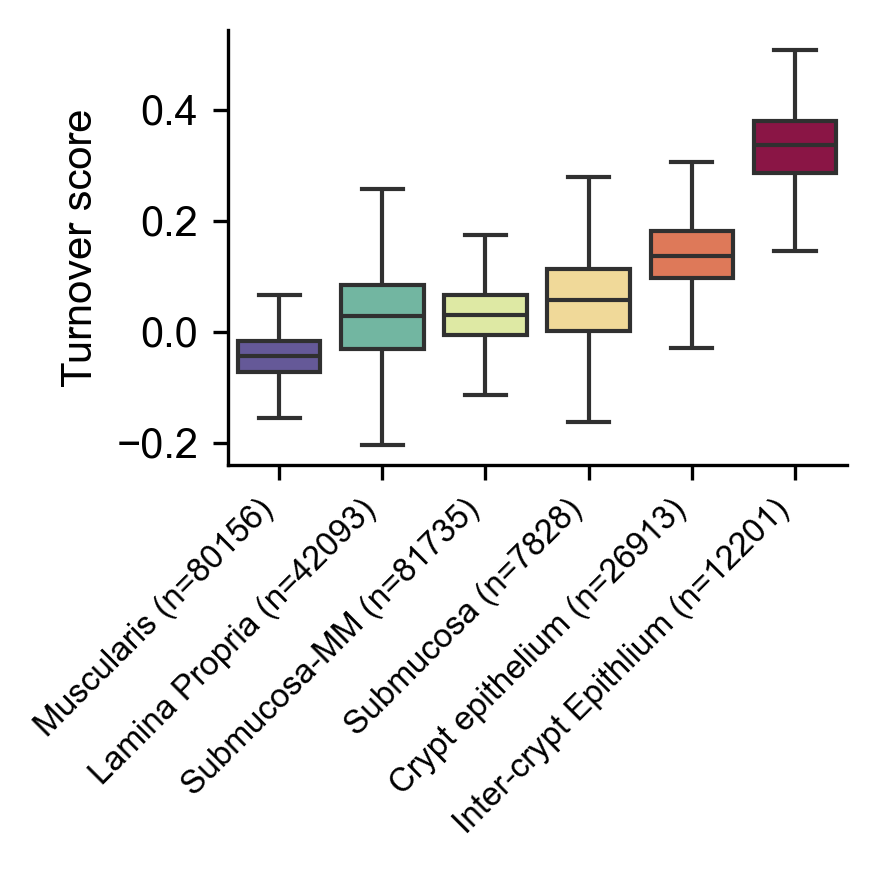

In [17]:
# add boxplot of shedding scores between knn clusters
# Calculate medians for sorting
median_shedding_scores = sdata.tables['square_008um'].obs.groupby('cluster_name')['shedding_score'].median().sort_values()
shedding_scores_ranks = median_shedding_scores.rank()

# calculate number of pixels in each cluster
cluster_counts = sdata.tables['square_008um'].obs['cluster_name'].value_counts().reindex(median_shedding_scores.index)
xticklabels = [f"{name} (n={count})" for name, count in zip(cluster_counts.index, cluster_counts.values)]

# Create a sorted categorical type for cluster_name
sdata.tables['square_008um'].obs['cluster_name'] = pd.Categorical(sdata.tables['square_008um'].obs['cluster_name'], categories=median_shedding_scores.index, ordered=True)

fig, ax = plt.subplots(figsize=(3,3), dpi=300)
sns.boxplot(x='cluster_name', y='shedding_score', data=sdata.tables['square_008um'].obs, showfliers=False, 
            ax=ax, palette=sns.color_palette(["#5E4FA2", "#66C2A5","#E6F598", "#FEE08B","#F46D43","#9E0142"]))
plt.ylabel("Turnover score")
ax.set_xticklabels(xticklabels, rotation=45, ha='right', fontsize=8)
plt.xticks(rotation=45, ha='right')
plt.xlabel("")
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.tight_layout()
plt.show()

fig.savefig(fig_path+"Fig4E_shedding_score_boxplot.pdf", dpi=300)

In [18]:
# map the ranks to the cluster names
sdata.tables['square_008um'].obs['cluster_rank'] = sdata.tables['square_008um'].obs['cluster_name'].map(shedding_scores_ranks).astype(int)
sdata.tables['square_008um'].obs['cluster_rank'] = sdata.tables['square_008um'].obs['cluster_name'].map(shedding_scores_ranks).astype(int)

In [19]:
tissue_positions = pd.read_parquet(folder_path+"binned_outputs/square_008um/spatial/tissue_positions.parquet")
tissue_positions.index = tissue_positions.barcode
tissue_positions.head(2)

,barcode,in_tissue,array_row,array_col,pxl_row_in_fullres,pxl_col_in_fullres
barcode,,,,,,
s_008um_00000_00000-1,s_008um_00000_00000-1,0,0,0,34008.469728,-2664.231359
s_008um_00000_00001-1,s_008um_00000_00001-1,0,0,1,34008.393417,-2635.006913


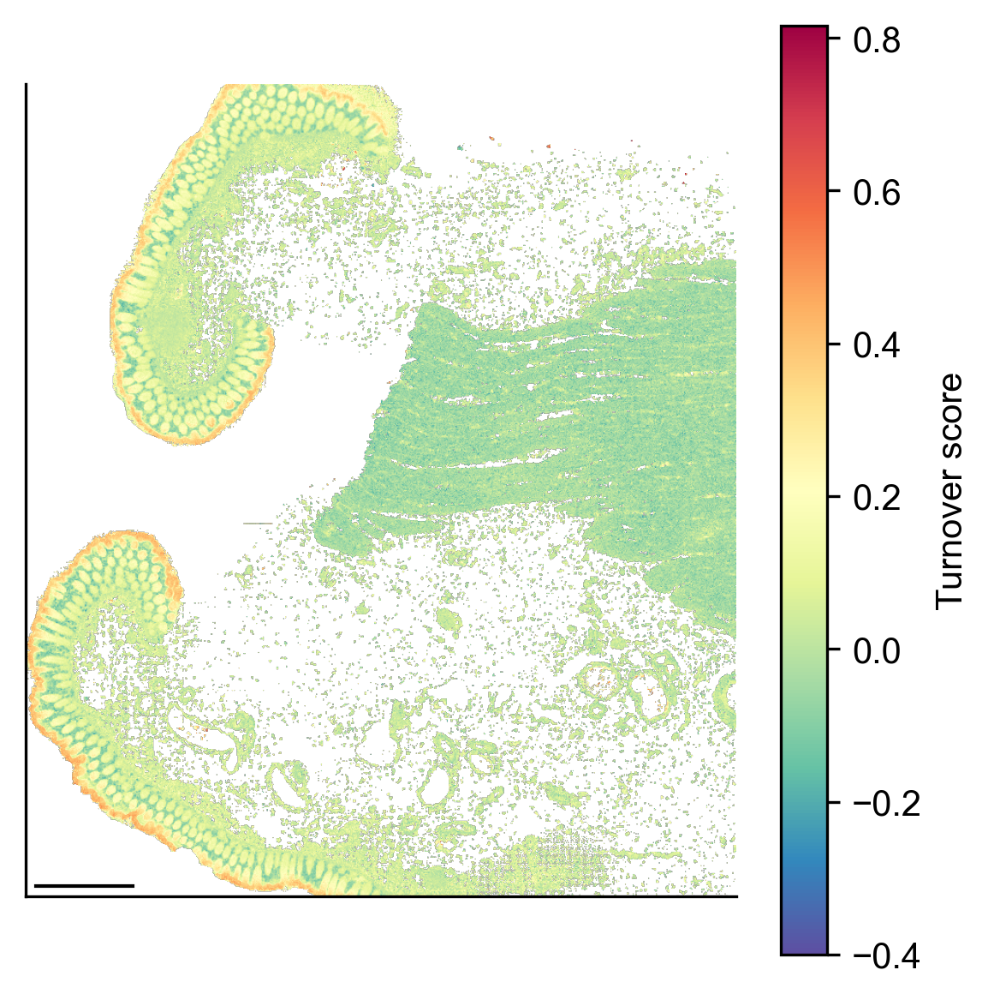

In [20]:
# sdata.tables['square_008um'].obs.shedding_score
pivot_table = sdata.tables['square_008um'].obs.pivot_table(index='array_row', columns='array_col', values='shedding_score').astype(float)
fig,ax = plt.subplots(figsize=(4,4), dpi=300)
plt.imshow(pivot_table, cmap="Spectral_r")
plt.gca().invert_yaxis()
# despine
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
# hde x and y ticks
plt.xticks([])
plt.yticks([])

# add colorbar
cbar = plt.colorbar()
cbar.set_label("Turnover score")

# add scalebar - plot line at size of 10 pxls near the bottom right corner
scalebar = 100
scalebar_start_x = 10
scalebar_start_y = 10
plt.plot([scalebar_start_x,scalebar_start_x+scalebar],[scalebar_start_y,scalebar_start_y], 'k', lw=1)

plt.tight_layout()
plt.show()

# fig.savefig(fig_path+"Fig4D_shedding_score_map_full2.pdf", dpi=300)

In [21]:
sdata.tables['square_008um'].obs['pxl_row_in_hires'] = sdata.tables['square_008um'].obs['pxl_row_in_fullres'] * scalefactors['tissue_hires_scalef']
sdata.tables['square_008um'].obs['pxl_col_in_hires'] = sdata.tables['square_008um'].obs['pxl_col_in_fullres'] * scalefactors['tissue_hires_scalef']

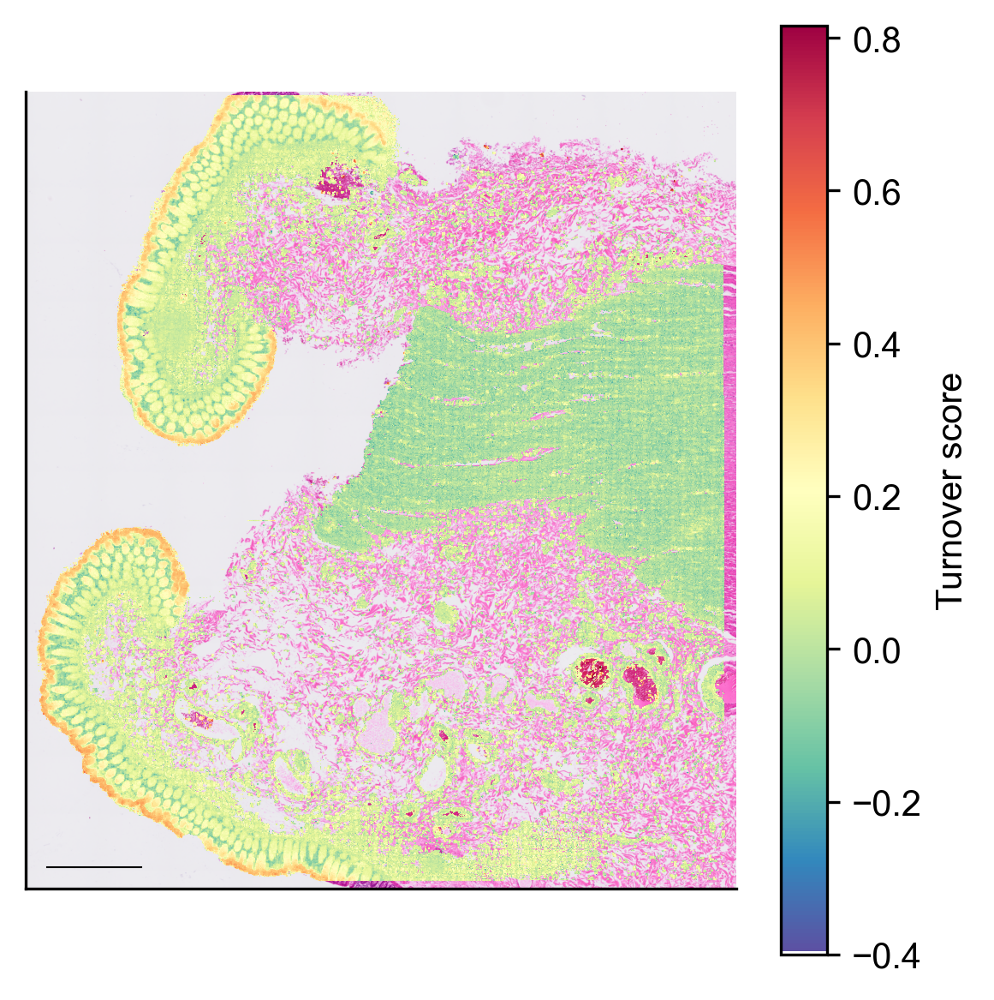

In [23]:
hires_path = paper_path+"/external_datasets/S_P3_NAT/spatial/tissue_hires_image.png"

hires_img = plt.imread(hires_path)
fig,ax = plt.subplots(figsize=(4,4), dpi=300)
ax.imshow(hires_img)

sns.scatterplot(data=sdata.tables['square_008um'].obs.sort_values(by='shedding_score', ascending=True), 
                x='pxl_col_in_hires', y='pxl_row_in_hires', hue='shedding_score', ax=ax,
                palette='Spectral_r', marker='s', s=scalefactors['tissue_hires_scalef']*1.5, edgecolor=None)

plt.legend([],[], frameon=False)  # Remove legend
plt.xticks([])
plt.yticks([])
plt.xlabel("")
plt.ylabel("")

# despine
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# add colorbar
norm = mpl.colors.Normalize(vmin=sdata.tables['square_008um'].obs['shedding_score'].min(), vmax=sdata.tables['square_008um'].obs['shedding_score'].max())
cbar = plt.colorbar(mpl.cm.ScalarMappable(norm=norm, cmap=new_cmap_spectral), ax=ax)
cbar.set_label("Turnover score")
# change the visible area
plt.xlim([0, 1650])
plt.ylim([700, 2550])

plt.gca().invert_yaxis()

scalebar_length = 800*scalefactors['tissue_hires_scalef']/scalefactors['microns_per_pixel']  # Length of the scalebar in pixels
scalebar_start_x = 50  # Starting x position of the scalebar
scalebar_start_y = 2500  # Starting y position of the scalebar
plt.plot([scalebar_start_x, scalebar_start_x + scalebar_length], 
         [scalebar_start_y, scalebar_start_y], 'k', lw=0.5)

plt.tight_layout()
plt.show()
fig.savefig(fig_path+"Fig4D_shedding_score_map_full2_HnE.pdf", dpi=300)

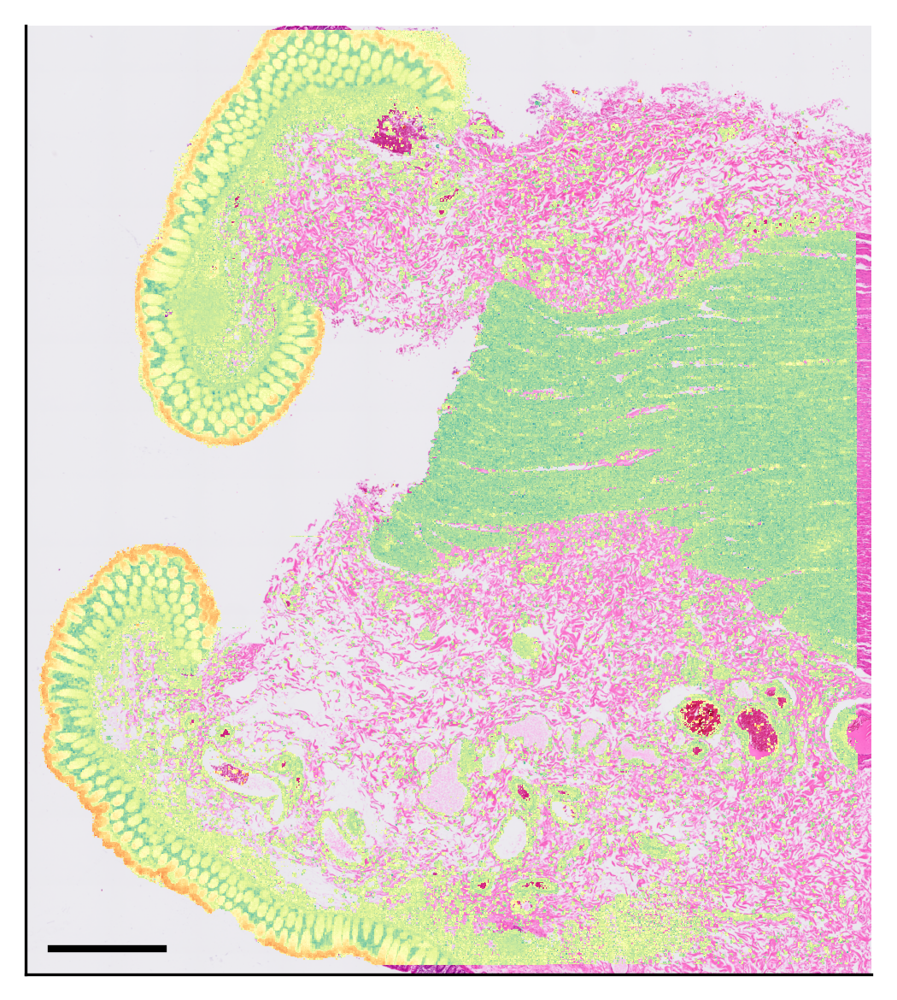

In [24]:
hires_path = oliviera_p3_nat_path+"/tissue_hires_image.png"
hires_img = plt.imread(hires_path)
fig,ax = plt.subplots(figsize=(4,4), dpi=300)
ax.imshow(hires_img)

sns.scatterplot(data=sdata.tables['square_008um'].obs.sort_values(by='shedding_score', ascending=True), 
                x='pxl_col_in_hires', y='pxl_row_in_hires', hue='shedding_score', ax=ax,
                palette='Spectral_r', marker='s', s=scalefactors['tissue_hires_scalef']*1.5, edgecolor=None)

plt.legend([],[], frameon=False)  # Remove legend
plt.xticks([])
plt.yticks([])
plt.xlabel("")
plt.ylabel("")

# despine
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# change the visible area
plt.xlim([0, 1650])
plt.ylim([700, 2550])

plt.gca().invert_yaxis()

scalebar_length = 800*scalefactors['tissue_hires_scalef']/scalefactors['microns_per_pixel']  # Length of the scalebar in pixels
scalebar_start_x = 50  # Starting x position of the scalebar
scalebar_start_y = 2500  # Starting y position of the scalebar
plt.plot([scalebar_start_x, scalebar_start_x + scalebar_length], 
         [scalebar_start_y, scalebar_start_y], 'k', lw=2)

plt.tight_layout()
plt.show()
fig.savefig(fig_path+"Fig4D_shedding_score_map_full2_HnE_wo_colorbar1.pdf", dpi=300)
fig.savefig(fig_path+"Fig4D_shedding_score_map_full2_HnE_wo_colorbar.tiff", dpi=300)

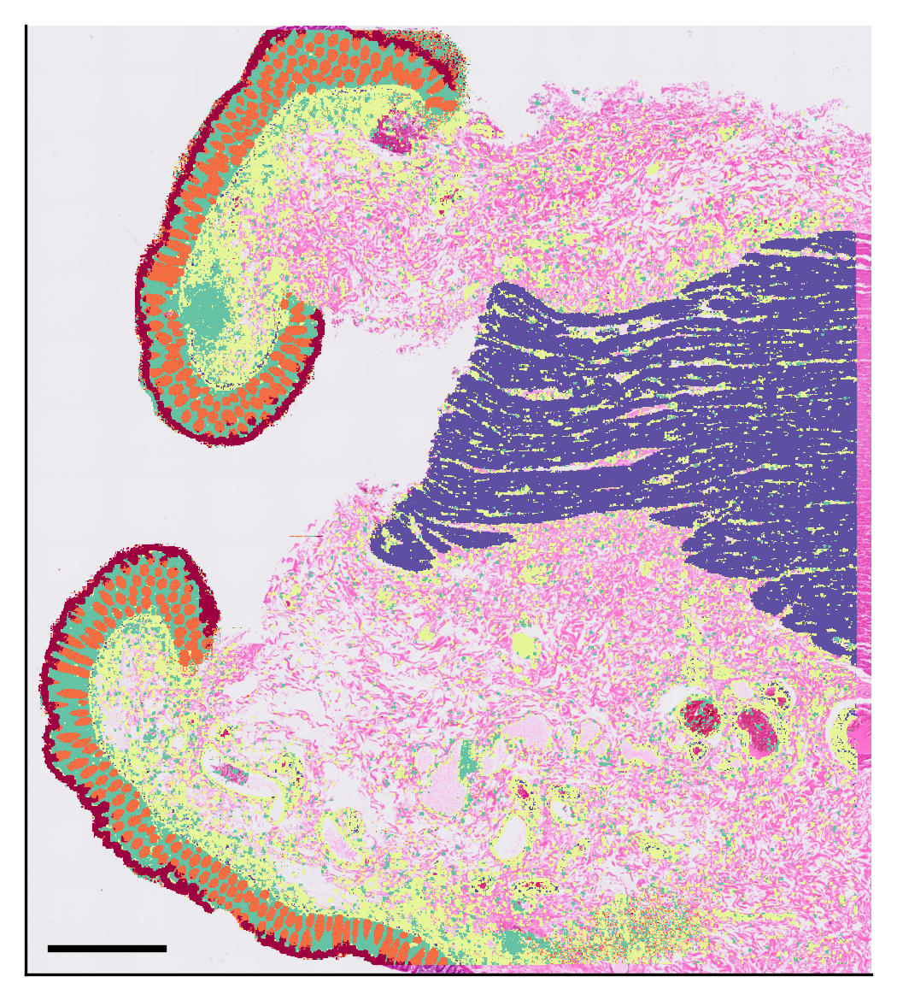

In [25]:
hires_path = oliviera_p3_nat_path+"/tissue_hires_image.png"
hires_img = plt.imread(hires_path)
fig,ax = plt.subplots(figsize=(4,4), dpi=300)
ax.imshow(hires_img)

sns.scatterplot(data=sdata.tables['square_008um'].obs, 
                x='pxl_col_in_hires', y='pxl_row_in_hires', hue='cluster_rank', ax=ax,
                palette='Spectral_r', marker='s', s=scalefactors['tissue_hires_scalef']*1.5, edgecolor=None)

plt.legend([],[], frameon=False)  # Remove legend
plt.xticks([])
plt.yticks([])
plt.xlabel("")
plt.ylabel("")

# despine
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# change the visible area
plt.xlim([0, 1650])
plt.ylim([700, 2550])

plt.gca().invert_yaxis()

# add scalebar
scalebar_length = 800*scalefactors['tissue_hires_scalef']/scalefactors['microns_per_pixel']  # Length of the scalebar in pixels
scalebar_start_x = 50  # Starting x position of the scalebar
scalebar_start_y = 2500  # Starting y position of the scalebar
plt.plot([scalebar_start_x, scalebar_start_x + scalebar_length], 
         [scalebar_start_y, scalebar_start_y], 'k', lw=2)

plt.tight_layout()
plt.show()
fig.savefig(fig_path+"Fig4C_KNN_map_full3_HnE.pdf", dpi=300)
fig.savefig(fig_path+"Fig4C_KNN_map_full3_HnE.tiff", dpi=300)

In [26]:
print(datetime.now())

2025-06-28 21:16:14.770594
